# C_Elegans_DME_imagedata_analysis-S2048_341-PCA-KMeans

## Conventions in this document

* PCA and LDA components are labeled with integers starting from 1 not 0

## Package versions used below

In [1]:
import wndcharm

In [2]:
wndcharm.__version__

'0.9.11'

Note this is a newer version of the WND-CHARM Python API that has an optimized WND5/ cross-validation implementation.

In [3]:
import numpy as np
np.__version__

'1.10.4'

In [4]:
import scipy
scipy.__version__

'0.17.0'

In [5]:
import IPython
IPython.__version__

'4.1.1'

In [6]:
import matplotlib
matplotlib.__version__

'1.5.1'

In [7]:
import sklearn
sklearn.__version__

'0.17'

In [8]:
from wndcharm.FeatureSpace import FeatureSpace

In [9]:
from wndcharm.FeatureSpacePredictionExperiment import FeatureSpaceClassificationExperiment

In [10]:
from wndcharm.visualization import PredictedValuesGraph

In [11]:
import matplotlib.pyplot as plt

In [12]:
%matplotlib inline

In [13]:
import numpy as np

In [14]:
import time

In [15]:
from scipy.spatial.distance import pdist, cdist, squareform

In [16]:
from sklearn.decomposition import PCA

In [17]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [18]:
from sklearn.metrics import silhouette_score

In [19]:
from sklearn.cluster import DBSCAN, KMeans 

In [20]:
pwd

u'/Users/colettace/projects/dme_pca'

In [21]:
ls Tiffs_all_days/*.fit

Tiffs_all_days/dme_c_elegans_lifeaspan_v3.2features.fit
Tiffs_all_days/dme_c_elegans_lifespan-S2048_341-l.fit
Tiffs_all_days/dme_c_elegans_lifespan-S2048_341-l_curated.fit


In [22]:
age = FeatureSpace.NewFromFitFile('Tiffs_all_days/dme_c_elegans_lifespan-S2048_341-l_curated.fit')

LOADED FEATURE SPACE FROM WND-CHARM .fit FILE Tiffs_all_days/dme_c_elegans_lifespan-S2048_341-l_curated.fit: <FeatureSpace "dme_c_elegans_lifespan-S2048_341-l_curated.fit" n_features=2919 n_total_samples=3523 n_samples_per_group=1 n_classes=13 samples_per_class=("00": 180, "01": 412, "02": 240, "03": 87, "04": 215, "05": 459, "06": 316, "07": 339, "08": 354, "09": 171, "10": 201, "11": 143, "12": 406)>


In [23]:
age.feature_set_version

'3.2'

## Utility functions

In [24]:
def ordered_uniq( labels ):
    seen = set()
    seen_add = seen.add
    return [ x for x in labels if not (x in seen or seen_add(x) ) ]

In [25]:
def translate_labels_to_ordered_labels( in_labels ):
    curr_order = ordered_uniq( in_labels )
    LUT = dict( zip( curr_order, sorted( curr_order ) ) )
    return [ LUT[ old ] for old in in_labels ]

In [26]:
def PrintCentroidStdevs( centroids, stdevs ):
    rows, cols = centroids.shape
    outstr = " \t" + '\t'.join( [ str(_) for _ in range(cols) ] ) + '\n'

    for i in xrange(rows):
        outstr += '{}\t'.format( i )
        for j in xrange(cols):
            outstr += '{:0.2f} ({:0.2f})'.format( centroids[ i, j ], stdevs[i,j] ) + '\t'
        outstr += '\n'
    print outstr

In [27]:
def Centroids( featurespace, labels, print_out=True ):
    "WE WANT LABELS, NOT SAMPLE NAMES!!"
    centroids = []
    stdevs = []

    #labels = translate_labels_to_ordered_labels( labels )
    unique_labels = ordered_uniq( labels )

    labels = np.array( labels )
    for curr_label in unique_labels:
        class_fs = featurespace[ np.where( labels == curr_label) ]
        centroids.append( class_fs.mean(axis=0) )
        stdevs.append( class_fs.std(axis=0) )

    centroids = np.array( centroids )
    stdevs = np.array( stdevs )
    
    if print_out:
        PrintCentroidStdevs( centroids, stdevs )

    return centroids, stdevs

In [60]:
def summary_statistic( featurespace, labels, print_out=True):
    try:
        labels.shape
    except AttributeError:
        labels = np.array( labels )
    sil = silhouette_score( featurespace, labels )#, metric='euclidean')
    if print_out:
        print "Silhouette score: {:0.3f}".format(sil)
    
    centroids, stdevs = Centroids( featurespace, labels, print_out=False )
    #print 'centroids shape', centroids.shape
    
    dists = cdist( featurespace, centroids )
    if print_out:
        print "Mean Dist to class centroid (stdev):"
    class_mean_dists, class_dists_stdevs = Centroids( dists, labels, print_out=print_out )

    return sil, class_mean_dists, class_dists_stdevs

In [65]:
def LDA_2D_plot( lda_space, labels, cmp1=0, cmp2=1, xmin=None, xmax=None, ymin=None, ymax=None,
                chart_title=None, figsize=(15,10) ):

    if chart_title == None:
        chart_title = 'STATE LABELS IN ALL AGE LDA SPACE'

    chart_title += ' (components {}&{})'.format( cmp1+1, cmp2+1 )

    class_labels = ordered_uniq( labels )
    numeric_labels = [ float( _ ) for _ in class_labels ]
    n = len(class_labels)
    class_colors = plt.cm.jet( [ float(i)/(n-1) for i in xrange(n) ] )
    class_shapes = list(('o','v','^','<','>','s','p','*','h','H','8','D','d','o'))[:n]

    if xmin == None:
        xmin = lda_space[:,cmp1].min()
    if xmax == None:
        xmax = lda_space[:,cmp1].max()
    if ymin == None:
        ymin = lda_space[:,cmp2].min()
    if ymax == None:
        ymax = lda_space[:,cmp2].max()
        
    fig, ax = plt.subplots( figsize=figsize )
    ax.set_xlim( ( xmin, xmax ) )
    ax.set_xlabel( 'LDA Component {}'.format( cmp1 + 1 ), size=16)
    
    ax.set_ylim( ( ymin, ymax ))
    ax.set_ylabel( 'LDA Component {}'.format( cmp2 + 1 ), size=16)

    for label, color, shape in zip( class_labels, class_colors, class_shapes ):
        indices = np.where( [ l == label for l in labels ] )
        class_features = lda_space[ indices ]
        ax.scatter( class_features[:, cmp1], class_features[:, cmp2], c=color, label=label, marker=shape, s=100, alpha=0.3)

    ax.legend( fontsize=16, loc='lower right' )
    ax.set_title(chart_title, size=18)
    return fig

In [64]:
def StateCentroidsInAgeLDASpace( age_lda, age_fs, state_fs, print_out=True ):
    centroids_ = []
    stdevs_ = []

    for i, label in enumerate( state_fs.class_names ):
        sample_list = state_fs.sample_names[i]
        indices = np.where( [ sn in sample_list for sn in age_fs._contiguous_sample_names ] )
        state_features = age_lda[ indices ]
        centroids_.append( state_features.mean(axis=0) )
        stdevs_.append( state_features.std(axis=0) )

    centroids_ = np.array( centroids_ )
    stdevs_ = np.array( stdevs_ )
    
    if print_out:
        PrintCentroidStdevs( centroids_, stdevs_ )
    return centroids_, stdevs_

# Section 1: PCA

In [72]:
all_pca_fitter = PCA()
all_pca_fitter.fit( age.data_matrix )
all_pca_fitter.explained_variance_ratio_

array([  9.69117333e-01,   1.76032637e-02,   5.81725527e-03, ...,
         1.11672075e-32,   8.97382504e-33,   3.57921283e-33])

In [73]:
all_pca_featurespace = all_pca_fitter.transform( age.data_matrix )

In [74]:
class_labels = age.class_names
class_colors = plt.cm.jet( [ val/len(class_labels) for val in age.interpolation_coefficients] )
class_shapes = list(('o','v','^','<','>','s','p','*','h','H','8','D','d','o'))[:len(class_labels)]

## PCA All classes *WITH* pixel normalization

/usr/local/lib/python2.7/site-packages/matplotlib/figure.py:397: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


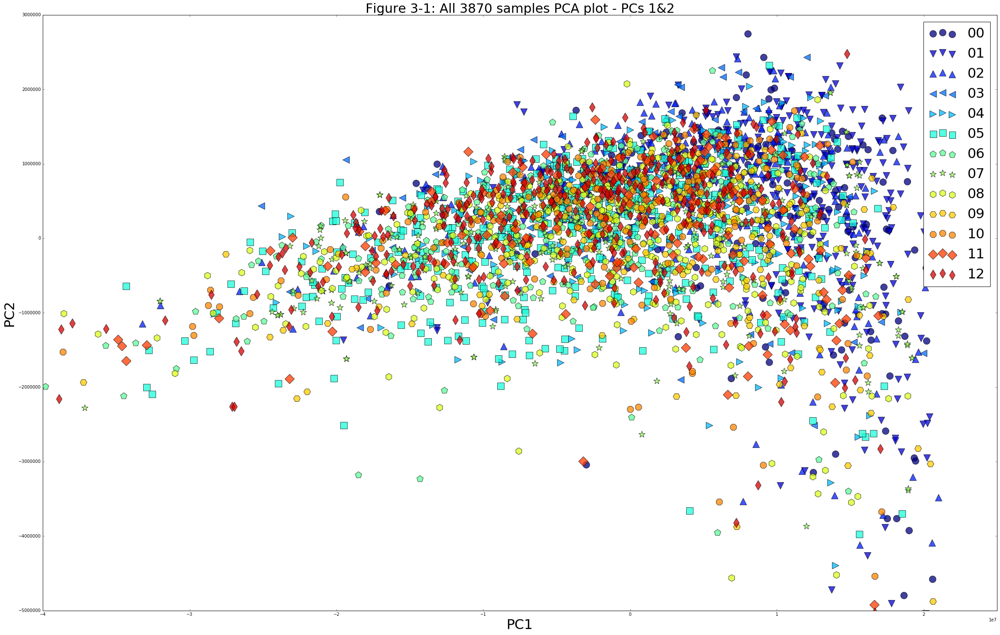

In [26]:
fig, ax = plt.subplots(figsize=(40,25))
#ax.set_xlim( ( all_pca_featurespace[:,0].min(), all_pca_featurespace[:,0].max() ) )
ax.set_xlim( ( -4e7, 2.5e7  ) )
ax.set_xlabel( 'PC1', size=32)
#ax.set_ylim( ( all_pca_featurespace[:,1].min(), all_pca_featurespace[:,1].max() ) )
ax.set_ylim( ( -5e6, 3e6) )
ax.set_ylabel( 'PC2', size=32)

for label, color, shape in zip( class_labels, class_colors, class_shapes ):
    indices = np.where( [ gt == label for gt in age._contiguous_ground_truth_labels ] )
    #print "============================================\n", class_name
    #print indices
    class_features = all_pca_featurespace[ indices ]
    #print class_features.shape
    ax.scatter( class_features[:, 0], class_features[:, 1], c=color, label=label, marker=shape, s=250, alpha=0.75)
ax.legend(fontsize=32)
ax.set_title('Figure 3-1: All 3870 samples PCA plot - PCs 1&2', size=30)
fig.show()

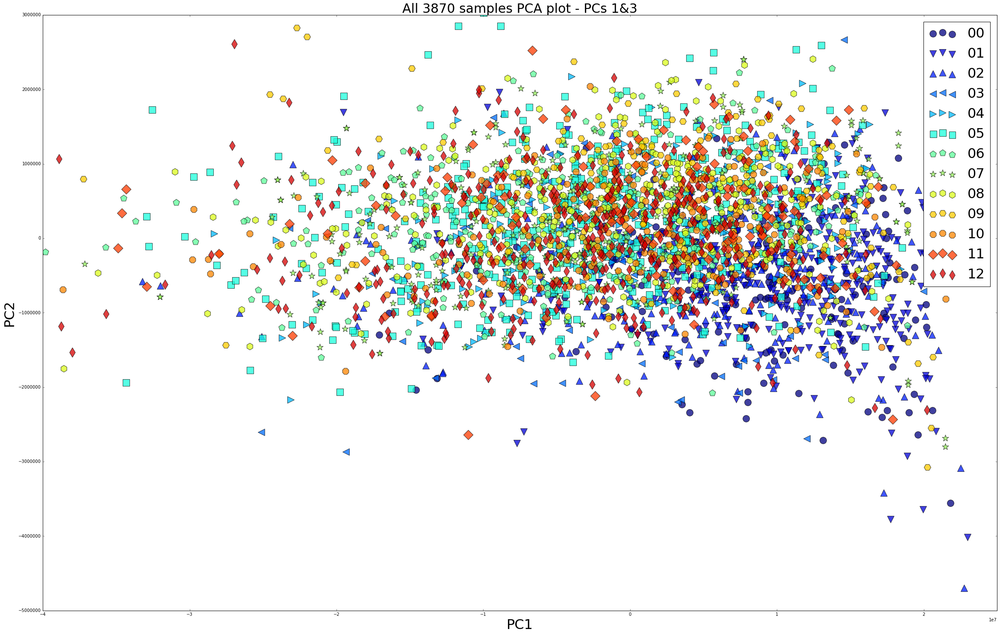

In [75]:
fig, ax = plt.subplots(figsize=(40,25))
#ax.set_xlim( ( all_pca_featurespace[:,0].min(), all_pca_featurespace[:,0].max() ) )
ax.set_xlim( ( -4e7, 2.5e7  ) )
ax.set_xlabel( 'PC1', size=32)
#ax.set_ylim( ( all_pca_featurespace[:,1].min(), all_pca_featurespace[:,1].max() ) )
ax.set_ylim( ( -5e6, 3e6) )
ax.set_ylabel( 'PC2', size=32)

for label, color, shape in zip( class_labels, class_colors, class_shapes ):
    indices = np.where( [ gt == label for gt in age._contiguous_ground_truth_labels ] )
    #print "============================================\n", class_name
    #print indices
    class_features = all_pca_featurespace[ indices ]
    #print class_features.shape
    ax.scatter( class_features[:, 0], class_features[:, 2], c=color, label=label, marker=shape, s=250, alpha=0.75)
ax.legend(fontsize=32)
ax.set_title('All 3870 samples PCA plot - PCs 1&3', size=30)
fig.show()

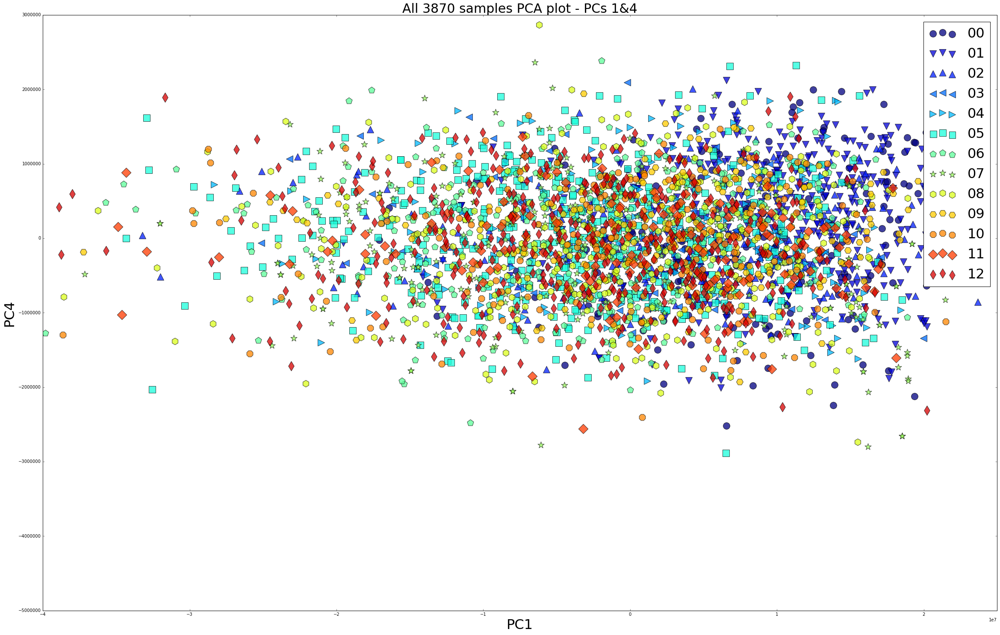

In [76]:
fig, ax = plt.subplots(figsize=(40,25))
#ax.set_xlim( ( all_pca_featurespace[:,0].min(), all_pca_featurespace[:,0].max() ) )
ax.set_xlim( ( -4e7, 2.5e7  ) )
ax.set_xlabel( 'PC1', size=32)
#ax.set_ylim( ( all_pca_featurespace[:,1].min(), all_pca_featurespace[:,1].max() ) )
ax.set_ylim( ( -5e6, 3e6) )
ax.set_ylabel( 'PC4', size=32)

for label, color, shape in zip( class_labels, class_colors, class_shapes ):
    indices = np.where( [ gt == label for gt in age._contiguous_ground_truth_labels ] )
    #print "============================================\n", class_name
    #print indices
    class_features = all_pca_featurespace[ indices ]
    #print class_features.shape
    ax.scatter( class_features[:, 0], class_features[:, 3], c=color, label=label, marker=shape, s=250, alpha=0.75)
ax.legend(fontsize=32)
ax.set_title('All 3870 samples PCA plot - PCs 1&4', size=30)
fig.show()

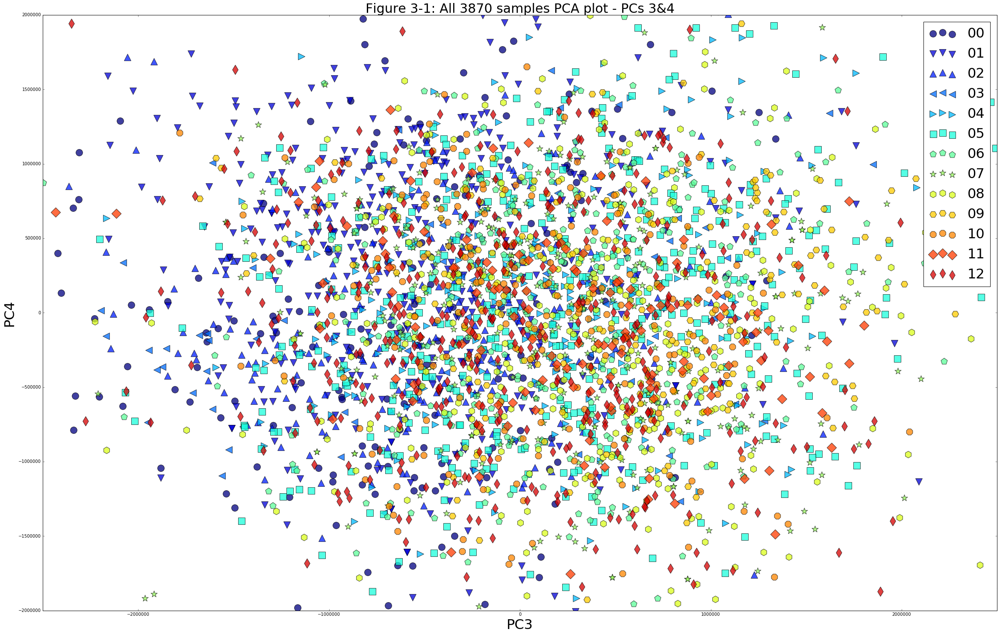

In [27]:
fig, ax = plt.subplots(figsize=(40,25))
ax.set_xlim( ( all_pca_featurespace[:,2].min(), all_pca_featurespace[:,2].max() ) )
ax.set_xlim( ( -2.5e6, 2.5e6  ) )
ax.set_xlabel( 'PC3', size=32)
ax.set_ylim( ( all_pca_featurespace[:,3].min(), all_pca_featurespace[:,3].max() ) )
ax.set_ylim( ( -2e6, 2e6) )
ax.set_ylabel( 'PC4', size=32)

for label, color, shape in zip( class_labels, class_colors, class_shapes ):
    indices = np.where( [ gt == label for gt in age._contiguous_ground_truth_labels ] )
    #print "============================================\n", class_name
    #print indices
    class_features = all_pca_featurespace[ indices ]
    #print class_features.shape
    ax.scatter( class_features[:, 2], class_features[:, 3], c=color, label=label, marker=shape, s=250, alpha=0.75)
ax.legend(fontsize=32)
ax.set_title('Figure 3-1: All 3870 samples PCA plot - PCs 3&4', size=30)
fig.show()

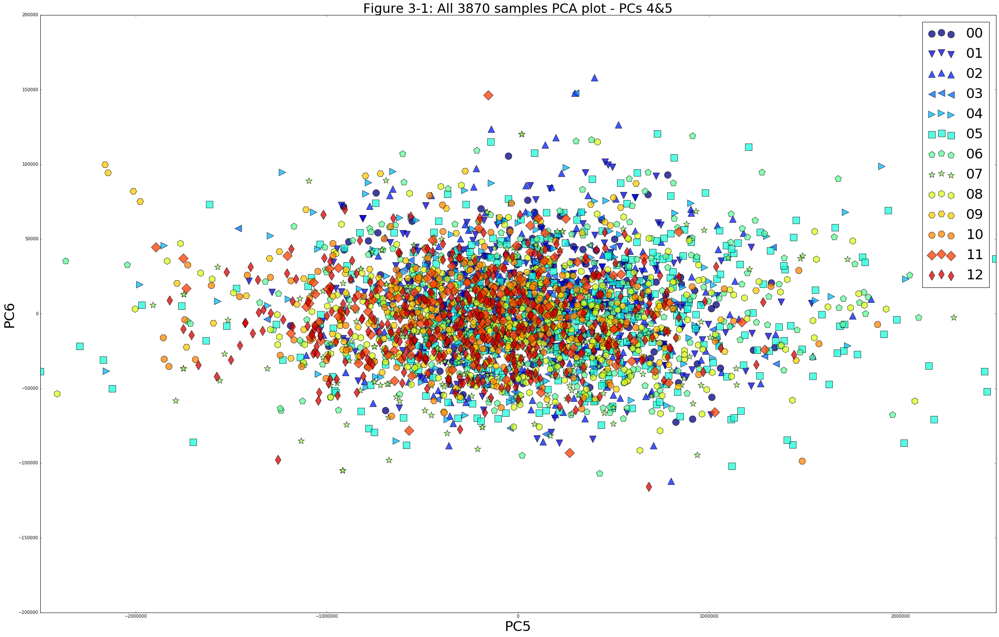

In [28]:
fig, ax = plt.subplots(figsize=(40,25))
ax.set_xlim( ( all_pca_featurespace[:,4].min(), all_pca_featurespace[:,4].max() ) )
ax.set_xlim( ( -2.5e6, 2.5e6  ) )
ax.set_xlabel( 'PC5', size=32)
ax.set_ylim( ( all_pca_featurespace[:,5].min(), all_pca_featurespace[:,5].max() ) )
ax.set_ylim( ( -2e5, 2e5) )
ax.set_ylabel( 'PC6', size=32)

for label, color, shape in zip( class_labels, class_colors, class_shapes ):
    indices = np.where( [ gt == label for gt in age._contiguous_ground_truth_labels ] )
    #print "============================================\n", class_name
    #print indices
    class_features = all_pca_featurespace[ indices ]
    #print class_features.shape
    ax.scatter( class_features[:, 4], class_features[:, 5], c=color, label=label, marker=shape, s=250, alpha=0.75)
ax.legend(fontsize=32)
ax.set_title('Figure 3-1: All 3870 samples PCA plot - PCs 4&5', size=30)
fig.show()

In [37]:
ds, stds = summary_statistic( all_pca_featurespace, age._contiguous_ground_truth_labels, print_out=False)

Silhouette score: -0.165
Mean Dist to class centroid (+/- stdev):


## LDA

In [30]:
all_lda_fitter = LinearDiscriminantAnalysis()
all_lda_fitter.fit( age.data_matrix, age._contiguous_ground_truth_labels )
all_lda_featurespace = all_lda_fitter.transform( age.data_matrix )

/usr/local/lib/python2.7/site-packages/sklearn/discriminant_analysis.py:453: UserWarning: The priors do not sum to 1. Renormalizing
  UserWarning)
/usr/local/lib/python2.7/site-packages/sklearn/discriminant_analysis.py:387: UserWarning: Variables are collinear.
  warnings.warn("Variables are collinear.")


In [31]:
mins = all_lda_featurespace.min(axis=0)
maxs = all_lda_featurespace.max(axis=0)
stdevs = all_lda_featurespace.std(axis=0)

for i, (n,x,d) in enumerate( zip( mins, maxs, stdevs) ):
    print i, n, x, d

0 -10.7269231735 7.59744225937 4.3325020577
1 -6.57606125249 7.97860557478 2.99575281886
2 -9.10617995075 5.68153275963 2.27713560438
3 -6.54029921885 5.94742436243 2.13312445067
4 -8.8858541445 5.00223557527 2.03908105576
5 -11.6470364934 5.53075499303 2.07645837208
6 -5.87982624959 5.16542619698 1.97604220191
7 -5.43986403492 9.46517966461 2.09204018219
8 -5.76343619439 6.19709497756 1.96583227991
9 -8.47396311085 6.10191102002 1.88924770689
10 -5.82011217517 5.65063658605 1.85060766553
11 -6.07562793186 6.10426863634 1.80285864103
12 -2.09481865218 2.68932804197 1.008762795


In [32]:
all_lda_featurespace.shape

(3523, 13)

## LDA All classes *WITH* pixel normalization
### Components 1 & 2

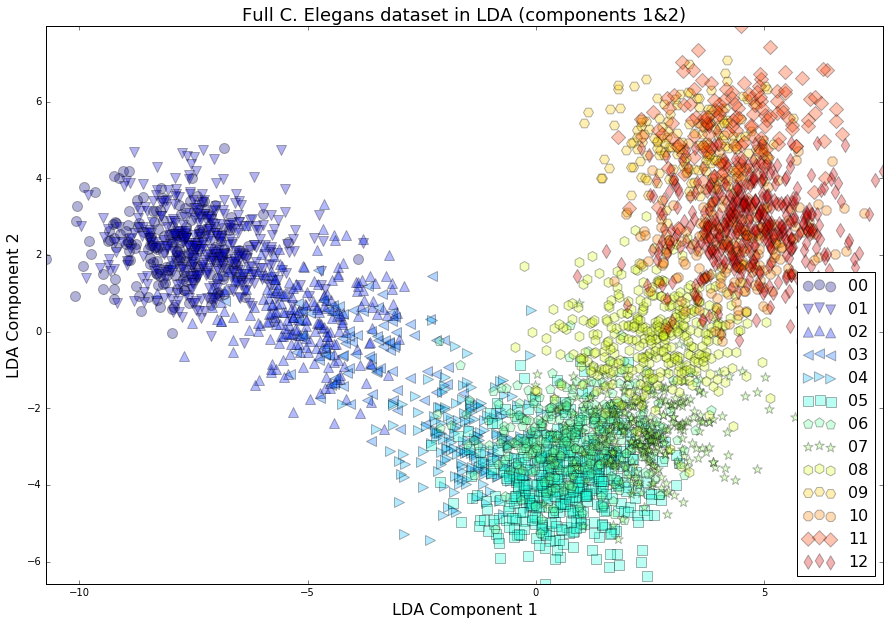

In [33]:
fig = LDA_2D_plot( lda_space=all_lda_featurespace,
             labels=age._contiguous_ground_truth_labels,
             cmp1=0,
             cmp2=1,
             xmin=None,
             xmax=None,
             ymin=None,
             ymax=None,
             chart_title='Full C. Elegans dataset in LDA')

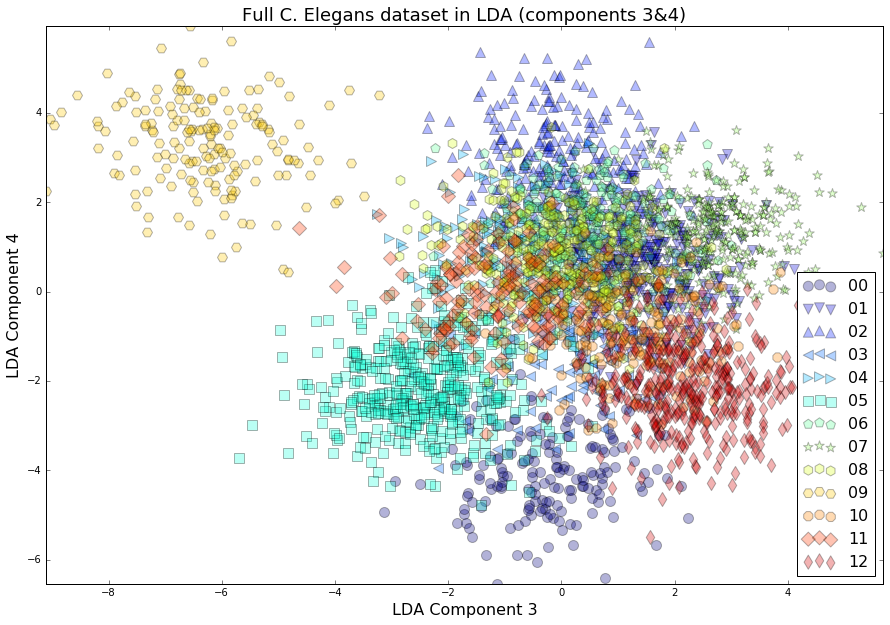

In [34]:
fig = LDA_2D_plot( lda_space=all_lda_featurespace,
             labels=age._contiguous_ground_truth_labels,
             cmp1=2,
             cmp2=3,
             xmin=None,
             xmax=None,
             ymin=None,
             ymax=None,
             chart_title='Full C. Elegans dataset in LDA')

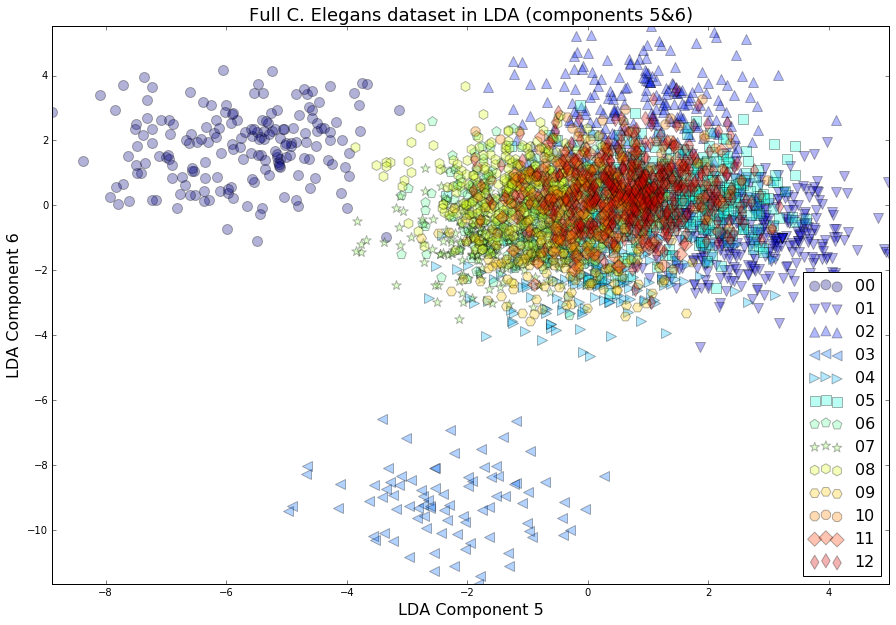

In [35]:
fig = LDA_2D_plot( lda_space=all_lda_featurespace,
             labels=age._contiguous_ground_truth_labels,
             cmp1=4,
             cmp2=5,
             xmin=None,
             xmax=None,
             ymin=None,
             ymax=None,
             chart_title='Full C. Elegans dataset in LDA')

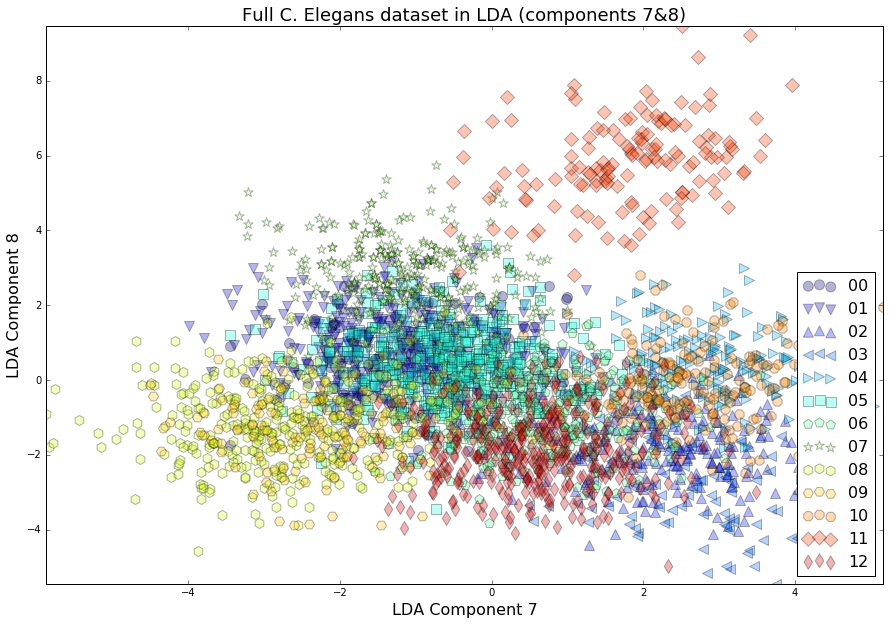

In [36]:
fig = LDA_2D_plot( lda_space=all_lda_featurespace,
             labels=age._contiguous_ground_truth_labels,
             cmp1=6,
             cmp2=7,
             xmin=None,
             xmax=None,
             ymin=None,
             ymax=None,
             chart_title='Full C. Elegans dataset in LDA')

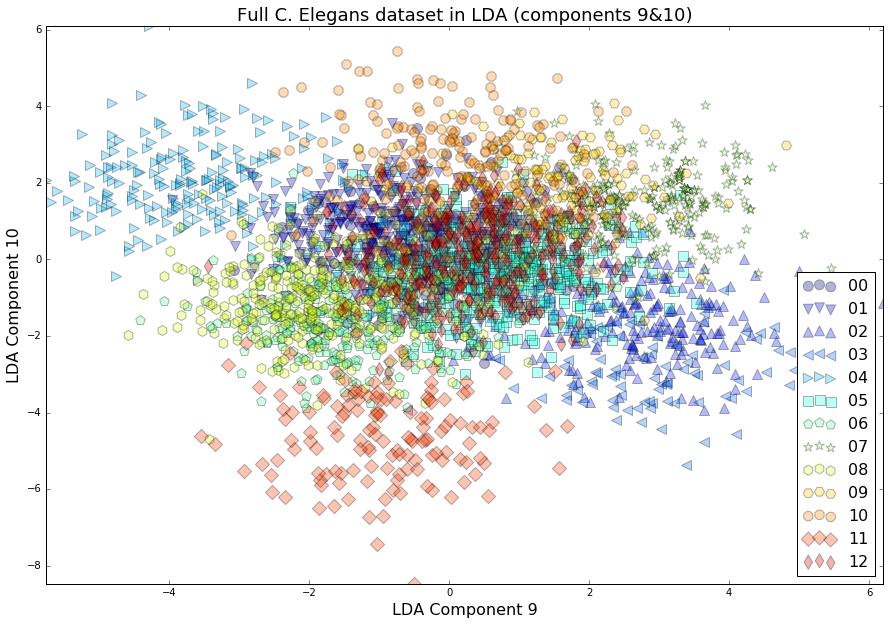

In [37]:
fig = LDA_2D_plot( lda_space=all_lda_featurespace,
             labels=age._contiguous_ground_truth_labels,
             cmp1=8,
             cmp2=9,
             xmin=None,
             xmax=None,
             ymin=None,
             ymax=None,
             chart_title='Full C. Elegans dataset in LDA')

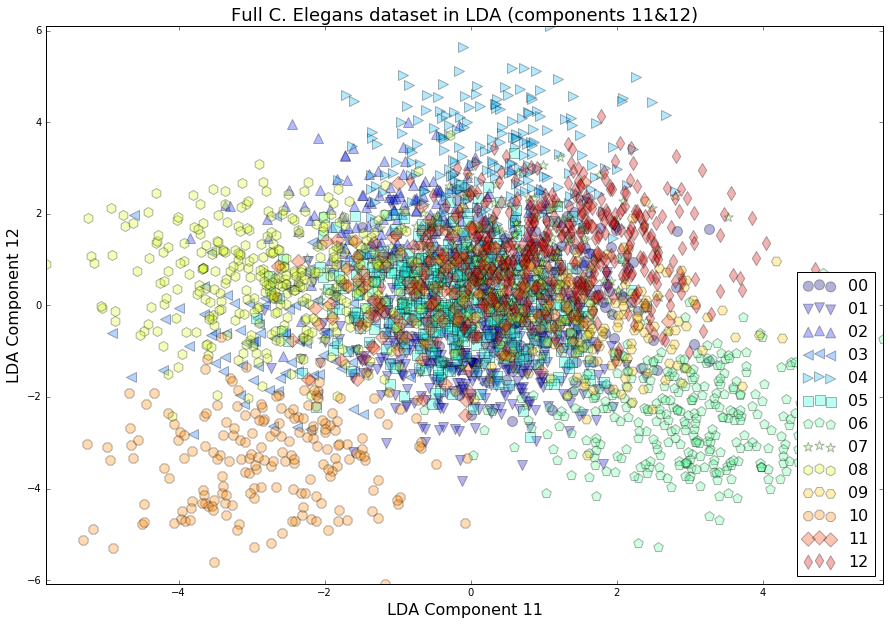

In [38]:
fig = LDA_2D_plot( lda_space=all_lda_featurespace,
             labels=age._contiguous_ground_truth_labels,
             cmp1=10,
             cmp2=11,
             xmin=None,
             xmax=None,
             ymin=None,
             ymax=None,
             chart_title='Full C. Elegans dataset in LDA')

In [39]:
silhouette_score(all_lda_featurespace, np.array(age._contiguous_ground_truth_labels) )

0.48365381685077197

## WND-CHARM on all 3674 pharynxes

Restart the IPython kernel to clear memory.

In [30]:
import time

In [50]:
t1 = time.time()
exp = FeatureSpaceClassificationExperiment.NewShuffleSplit( age, n_iter=500, name='WND-CHARM results for curated dataset', \
                                            features_size=0.15, lda=False, progress=False)
t2 = time.time()
print "500 splits took {:0.2f} minutes to complete".format( (t2-t1)/60 )

500 splits took 4.88 minutes to complete


In [51]:
exp.PerSampleStatistics(print_indiv=False, output_filepath='dme_c_elegans_S2048_341_n500_per_sample_stats.tsv')

Saving output of function "PerSampleStatistics()" to file "dme_c_elegans_S2048_341_n500_per_sample_stats.tsv", mode "w"


<FeatureSpaceClassificationExperiment #0 "WND-CHARM results for curated dataset" n_splits=500>

In [52]:
exp.Print(150)

FeatureSpaceClassificationExperiment "WND-CHARM results for curated dataset" (500 iterations)
55516/143000 correct = 38.82 +/- 0.25% w/ 95% conf. (normal approx. interval)
Standard Error: 2.2837
Pearson Corellation Coefficient (r): 0.8023
Coefficient of Determination (r^2): 0.6437
Spearman Coefficient: 0.8032


Confusion Matrix:
  	00	01	02	03	04	05	06	07	08	09	10	11	12	|	total	acc.
  	--	--	--	--	--	--	--	--	--	--	--	--	--	|	-----	----
00	4817	1875	709	1886	439	163	511	235	179	25	43	13	105	|	11000	43.79%
01	1663	5075	1399	899	503	133	313	343	205	220	72	21	154	|	11000	46.14%
02	636	1965	3418	254	1212	1171	1396	299	238	147	87	18	159	|	11000	31.07%
03	1621	517	205	6456	387	218	712	293	152	208	39	54	138	|	11000	58.69%
04	353	501	750	833	3863	1826	1791	494	357	59	63	0	110	|	11000	35.12%
05	104	153	666	228	1504	3998	2296	973	642	75	119	21	221	|	11000	36.35%
06	139	142	609	433	1547	2336	3161	1088	766	374	164	53	188	|	11000	28.74%
07	96	263	332	206	932	1402	1628	3238	1118	368	500	175	742	|	11

In [53]:
graph = PredictedValuesGraph( exp )

/usr/local/lib/python2.7/site-packages/matplotlib/__init__.py:1350: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


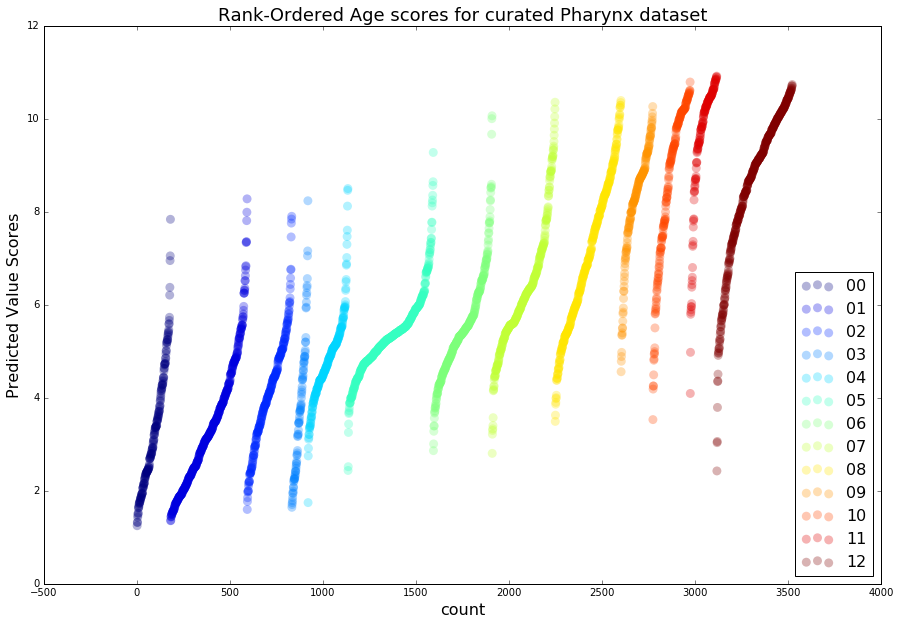

In [54]:
graph.RankOrderedPredictedValuesGraph(chart_title='Rank-Ordered Age scores for curated Pharynx dataset')

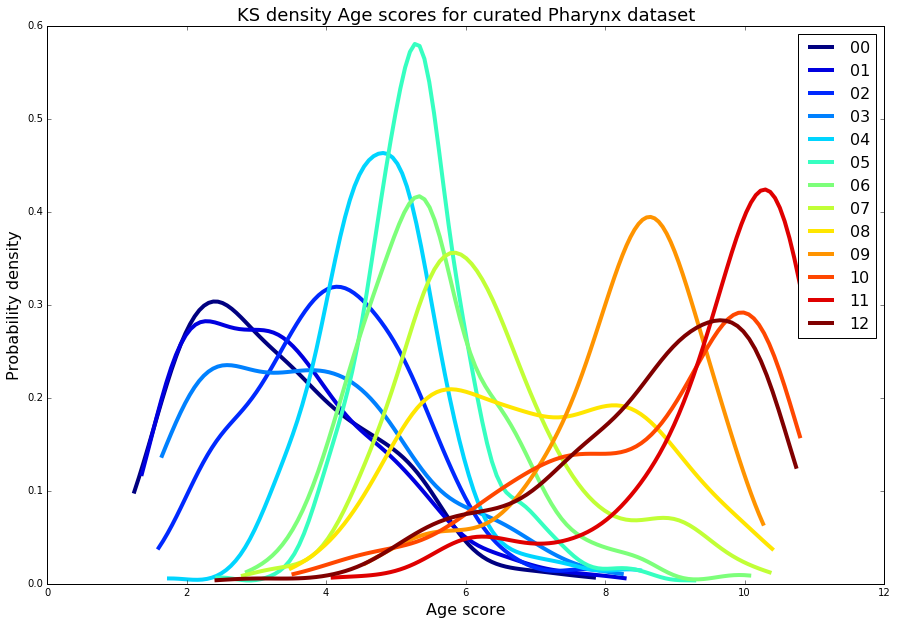

In [55]:
graph.KernelSmoothedDensityGraph(chart_title='KS density Age scores for curated Pharynx dataset')

In [40]:
from scipy.stats import pearsonr, spearmanr

In [41]:
pearsons = []
spearmans = []
# iterate over the oclumns
for single_LDA_col in all_lda_featurespace.T:
    pearsons.append( pearsonr( single_LDA_col, age._contiguous_ground_truth_values ))
    spearmans.append( spearmanr( single_LDA_col, age._contiguous_ground_truth_values ))
frmtstr = "{}\t{:0.3f}\t{:0.4e}\t{:0.3f}\t{:0.4e}"
print "LDA\tPears r\t Pears p\tSpear r\tSpear p"
for i, ( p, s ) in enumerate( zip ( pearsons, spearmans )):
    print frmtstr.format( i, p[0],p[1], s.correlation, s.pvalue)

LDA	Pears r	 Pears p	Spear r	Spear p
0	0.927	0.0000e+00	0.943	0.0000e+00
1	0.254	3.8868e-53	0.273	4.2234e-61
2	0.073	1.2632e-05	0.179	9.2791e-27
3	-0.072	1.7235e-05	-0.071	2.4383e-05
4	0.050	2.9624e-03	-0.111	3.6243e-11
5	0.037	2.6494e-02	0.031	6.4512e-02
6	0.046	6.7768e-03	0.038	2.3756e-02
7	-0.036	3.5037e-02	-0.194	3.0093e-31
8	-0.002	9.1254e-01	0.019	2.4919e-01
9	-0.008	6.1429e-01	0.025	1.3619e-01
10	0.019	2.6769e-01	0.043	1.0756e-02
11	0.004	8.0438e-01	0.053	1.8230e-03
12	-0.247	4.7529e-50	-0.249	6.1041e-51


In [42]:
print u'Pearson R\t' + u'\t'.join( [ u'{:0.2f}'.format( _[0] ) for _ in pearsons ] )
print u'Pearson p-val\t' + u'\t'.join( [ u'{:0.2f}'.format( _[1] ) for _ in pearsons ] )
print u'Spearman R\t' + u'\t'.join( [ u'{:0.2f}'.format( _.correlation ) for _ in spearmans ] )
print u'Spearman p-val\t' + u'\t'.join( [ u'{:0.2f}'.format( _.pvalue ) for _ in spearmans ] )

Pearson R	0.93	0.25	0.07	-0.07	0.05	0.04	0.05	-0.04	-0.00	-0.01	0.02	0.00	-0.25
Pearson p-val	0.00	0.00	0.00	0.00	0.00	0.03	0.01	0.04	0.91	0.61	0.27	0.80	0.00
Spearman R	0.94	0.27	0.18	-0.07	-0.11	0.03	0.04	-0.19	0.02	0.03	0.04	0.05	-0.25
Spearman p-val	0.00	0.00	0.00	0.00	0.00	0.06	0.02	0.00	0.25	0.14	0.01	0.00	0.00


## Trying out different KMeans n

In [61]:
def ConfusionMatrix( gt, pv ):
    
    print "Day/cluster confusion matrix:"
    gt = [ int(_) for _ in gt ]
    pv = [ int(_) for _ in pv ]
    from collections import defaultdict
    c = defaultdict( lambda: defaultdict( int ) )
    for row, col in zip( gt, pv ):
        c[row][col] += 1

    gt_names = ordered_uniq( gt )
    pred_class_names = sorted( ordered_uniq( pv ) )
    outstr = ''
    print '\t' + '\t'.join( [ str(_) for _ in pred_class_names ] )
    print '\t' + '\t'.join( ['---' for _ in pred_class_names ] )
    for gt_class in gt_names:
        gt_row_dict = c[ gt_class ]
        outstr += str(gt_class) + '\t'
        for pred_class in pred_class_names:
            if pred_class not in gt_row_dict:
                outstr += '0\t'
            else:
                outstr += '{0}\t'.format( gt_row_dict[ pred_class ] )
        #outstr += '|\t{0}\t{1:0.2f}%'.format( self.num_classifications_per_class[ gt_class ],
        #    100.0 * self.num_correct_classifications_per_class[ gt_class ] / self.num_classifications_per_class[ gt_class ] )
        outstr += '\n'
    print outstr

In [62]:
def try_kmeans_n( n ):
    fitter = KMeans( n_clusters=n )
    putative_labels = fitter.fit_predict( all_lda_featurespace )
    putative_labels = translate_labels_to_ordered_labels( putative_labels )
    sil, ds, stds = summary_statistic( all_lda_featurespace, putative_labels )
    ConfusionMatrix( age._contiguous_ground_truth_labels, putative_labels )
    fig = LDA_2D_plot( lda_space=all_lda_featurespace,
             labels=putative_labels,
             cmp1=0,
             cmp2=1,
             xmin=None,
             xmax=None,
             ymin=None,
             ymax=None,
             chart_title='{}-cluster KMeans (Silhouette={:0.3f})'.format(n, sil))
    fig.show()

2 KMEANS CLUSTERS
Silhouette score: 0.274
Mean Dist to class centroid (stdev):
 	0	1
0	6.88 (2.34)	11.51 (1.58)	
1	11.55 (1.63)	7.13 (1.69)	

Day/cluster confusion matrix:
	0	1
	---	---
0	180	0	
1	412	0	
2	240	0	
3	83	4	
4	3	212	
5	0	459	
6	0	316	
7	0	339	
8	0	354	
9	0	171	
10	0	201	
11	0	143	
12	0	406	

3 KMEANS CLUSTERS
Silhouette score: 0.232
Mean Dist to class centroid (stdev):
 	0	1	2
0	6.80 (2.30)	11.31 (1.57)	12.73 (1.49)	
1	10.69 (1.11)	5.92 (1.31)	9.06 (1.34)	
2	12.63 (1.52)	9.60 (2.03)	6.77 (1.82)	

Day/cluster confusion matrix:
	0	1	2
	---	---	---
0	180	0	0	
1	412	0	0	
2	239	1	0	
3	73	14	0	
4	1	214	0	
5	0	459	0	
6	0	315	1	
7	0	338	1	
8	0	63	291	
9	0	0	171	
10	0	0	201	
11	0	0	143	
12	0	0	406	

4 KMEANS CLUSTERS
Silhouette score: 0.245
Mean Dist to class centroid (stdev):
 	0	1	2	3
0	6.80 (2.30)	11.32 (1.57)	12.80 (1.47)	14.19 (1.45)	
1	10.69 (1.10)	5.91 (1.31)	8.92 (1.34)	11.66 (1.19)	
2	12.06 (1.24)	8.68 (1.36)	5.58 (1.15)	9.77 (1.07)	
3	14.17 (1.21)	12.23 (1.21)	10.62 (1.25

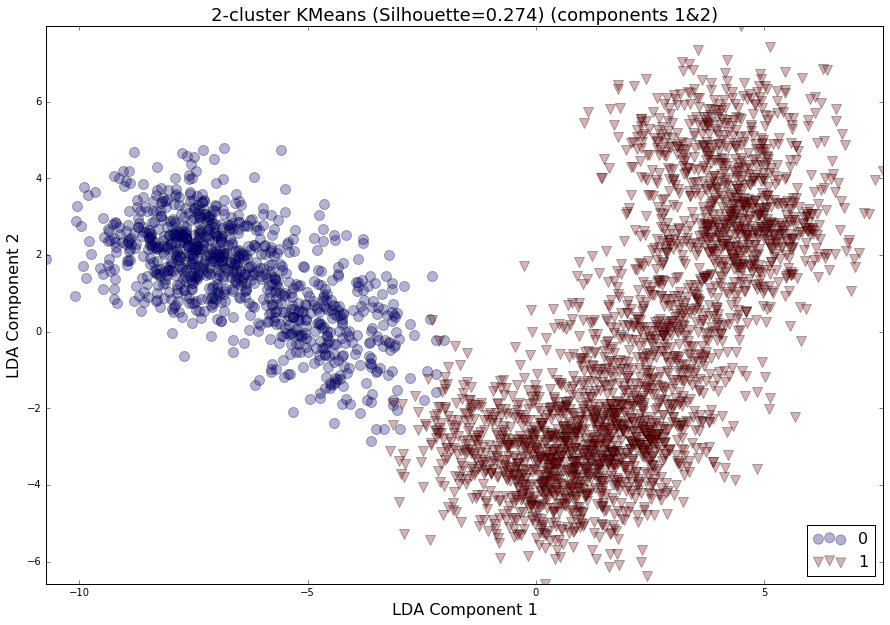

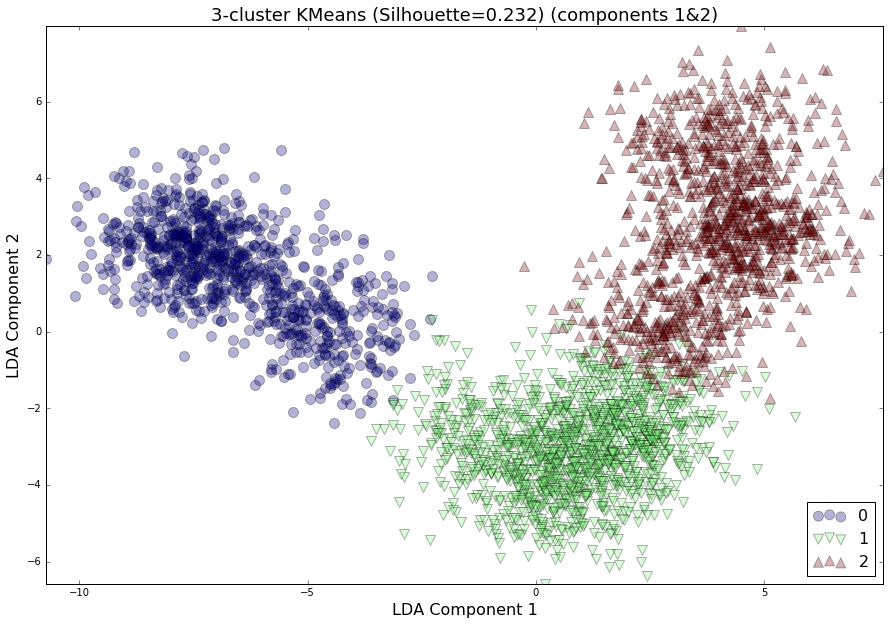

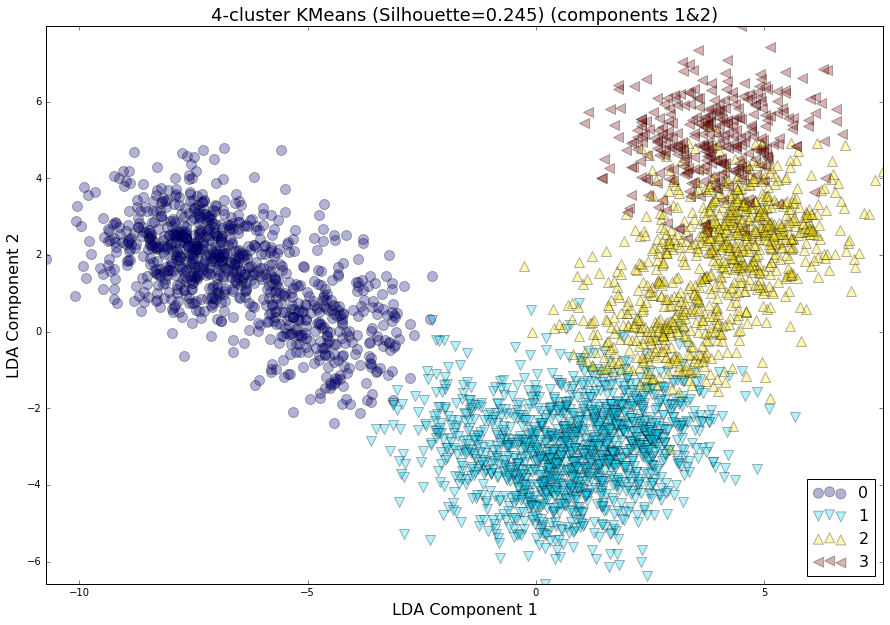

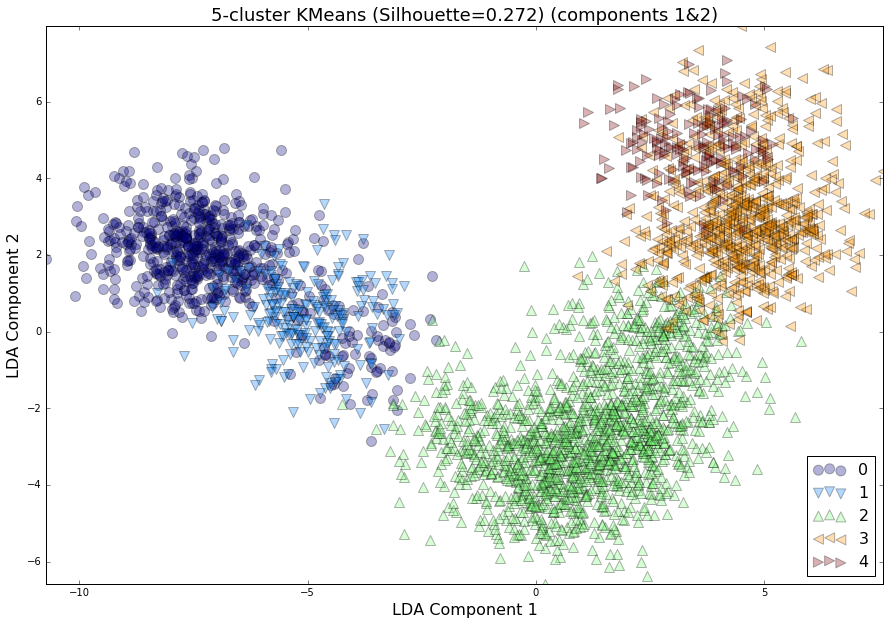

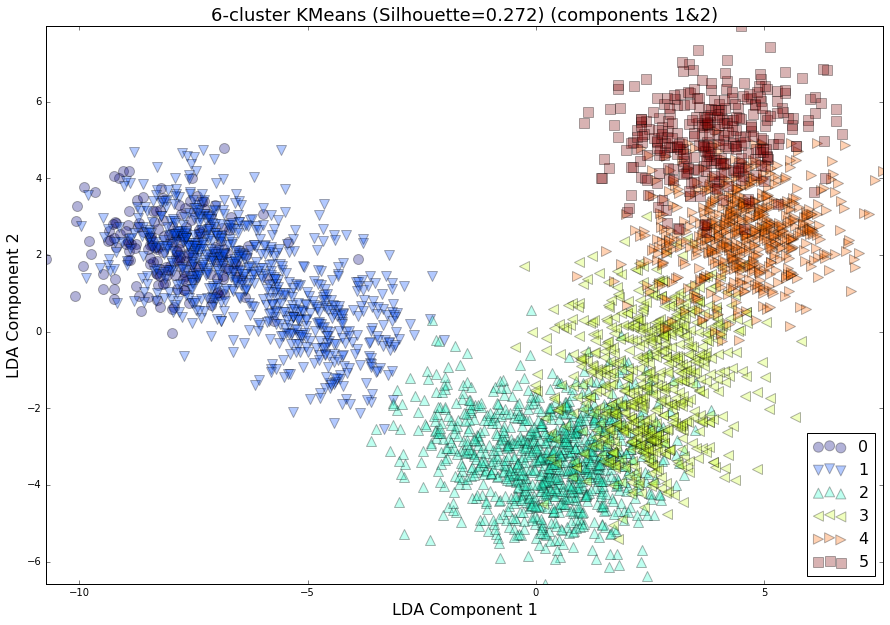

...

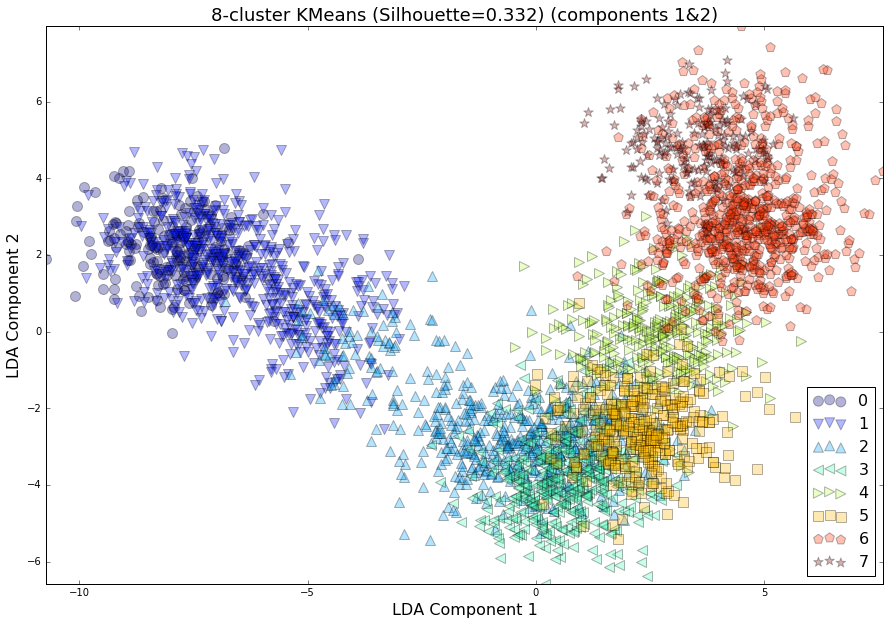

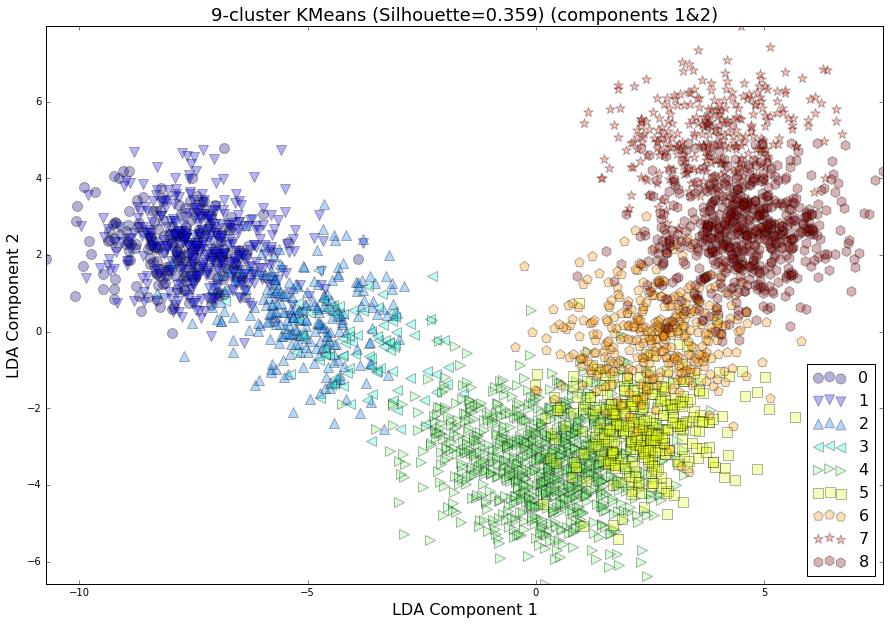

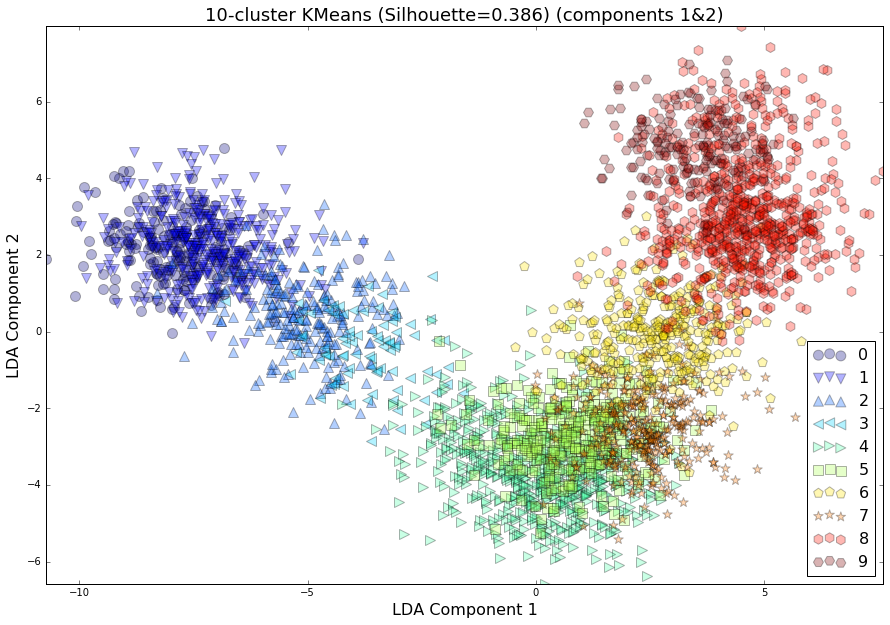

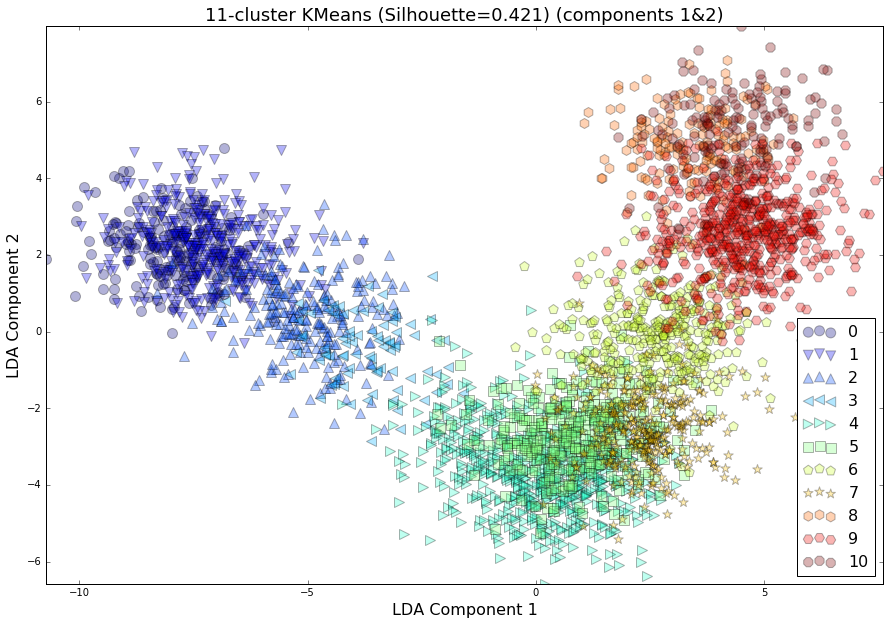

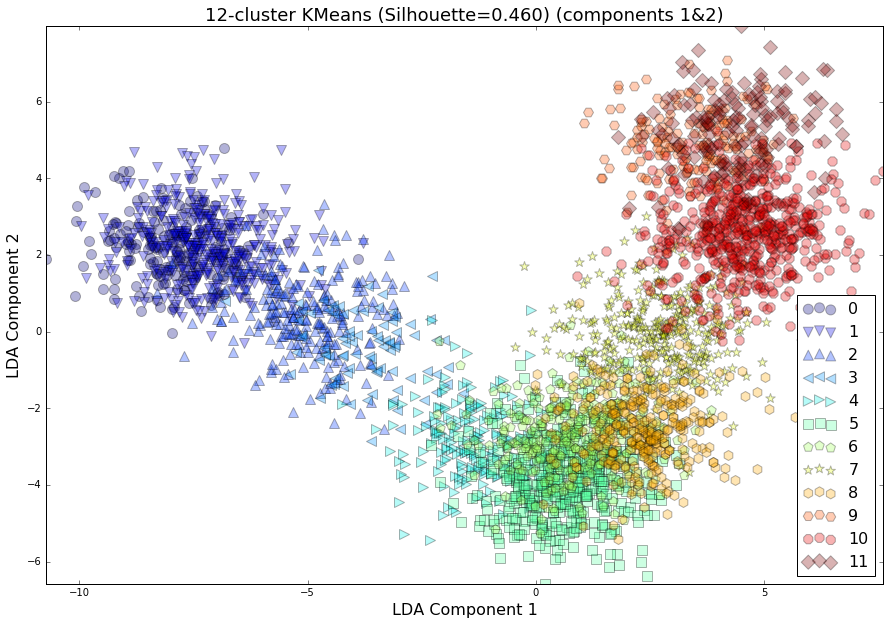

In [66]:
for n in xrange(2, 13):
    print '====================='
    print n, "KMEANS CLUSTERS"
    try_kmeans_n( n)

# Measuring distance using only LDA dims 1 & 2

In [67]:
def try_kmeans_Proj_1_2( n ):
    fitter = KMeans( n_clusters=n )
    subspace = all_lda_featurespace[:,:2]
    putative_labels = fitter.fit_predict( subspace )
    putative_labels = translate_labels_to_ordered_labels( putative_labels )
    sil, ds, stds = summary_statistic( subspace, putative_labels )
    ConfusionMatrix( age._contiguous_ground_truth_labels, putative_labels )
    fig = LDA_2D_plot( lda_space=subspace,
             labels=putative_labels,
             cmp1=0,
             cmp2=1,
             xmin=None,
             xmax=None,
             ymin=None,
             ymax=None,
             chart_title='{}-cluster KMeans (Silhouette={:0.3f})'.format(n, sil))
    fig.show()

2 KMEANS CLUSTERS in the first 2 dimensions
Silhouette score: 0.561
Mean Dist to class centroid (stdev):
 	0	1
0	1.93 (1.04)	9.05 (1.80)	
1	9.62 (1.63)	3.52 (1.57)	

Day/cluster confusion matrix:
	0	1
	---	---
0	180	0	
1	412	0	
2	240	0	
3	77	10	
4	11	204	
5	0	459	
6	0	316	
7	0	339	
8	0	354	
9	0	171	
10	0	201	
11	0	143	
12	0	406	

3 KMEANS CLUSTERS in the first 2 dimensions
Silhouette score: 0.613
Mean Dist to class centroid (stdev):
 	0	1	2
0	1.86 (0.98)	8.70 (1.89)	10.88 (1.48)	
1	8.79 (1.34)	1.84 (0.91)	6.78 (1.54)	
2	10.92 (1.17)	6.76 (1.67)	1.87 (0.94)	

Day/cluster confusion matrix:
	0	1	2
	---	---	---
0	180	0	0	
1	412	0	0	
2	239	1	0	
3	71	16	0	
4	2	213	0	
5	0	459	0	
6	0	316	0	
7	0	336	3	
8	0	199	155	
9	0	0	171	
10	0	0	201	
11	0	0	143	
12	0	0	406	

4 KMEANS CLUSTERS in the first 2 dimensions
Silhouette score: 0.503
Mean Dist to class centroid (stdev):
 	0	1	2	3
0	1.84 (0.96)	8.37 (1.87)	9.57 (1.79)	11.14 (1.43)	
1	8.38 (1.37)	1.47 (0.78)	3.54 (1.01)	8.19 (0.92)	
2	9.60 (1.01)	3.49

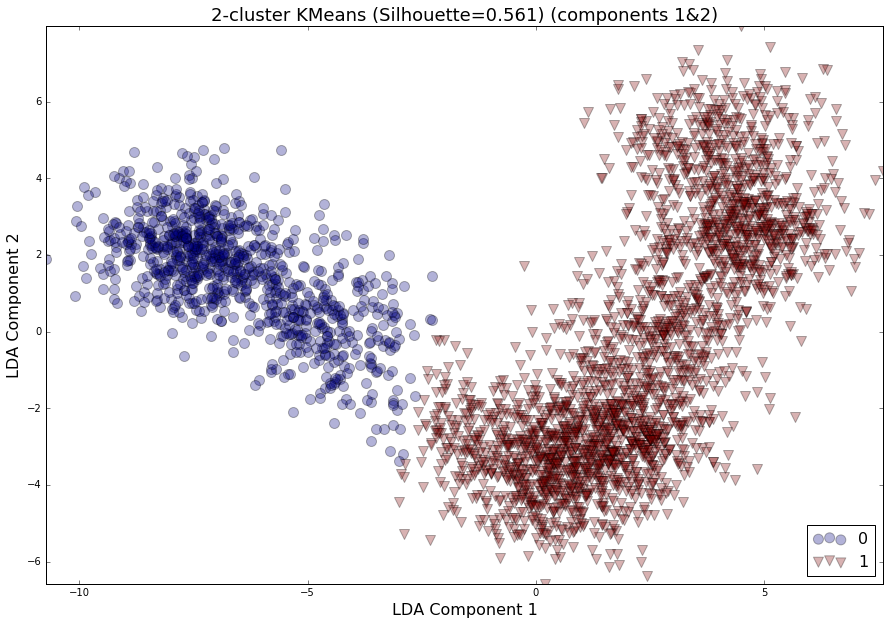

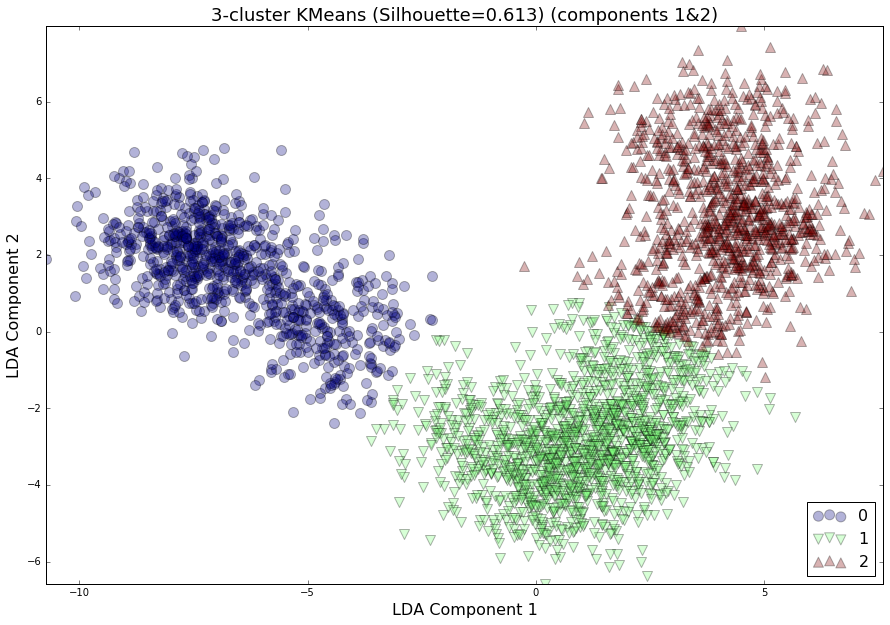

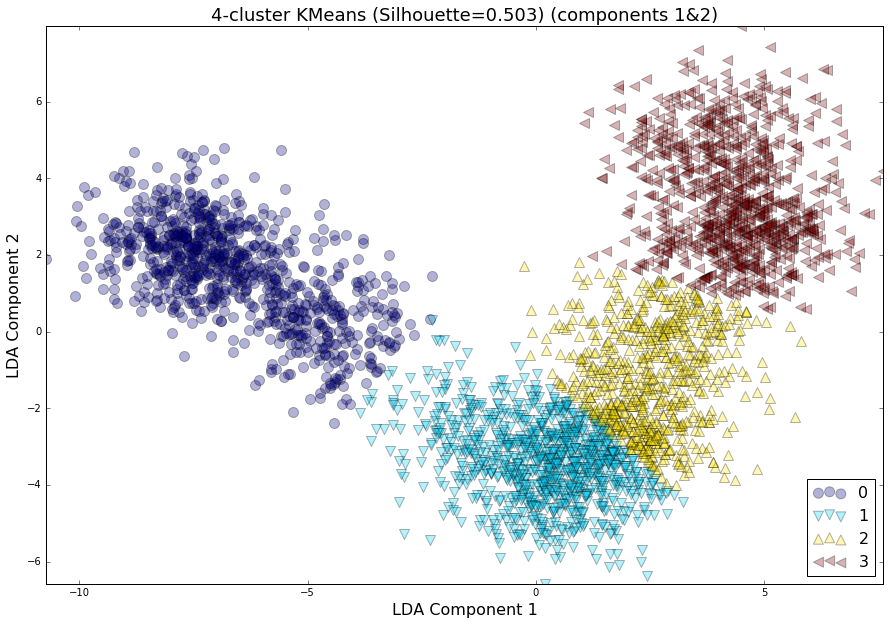

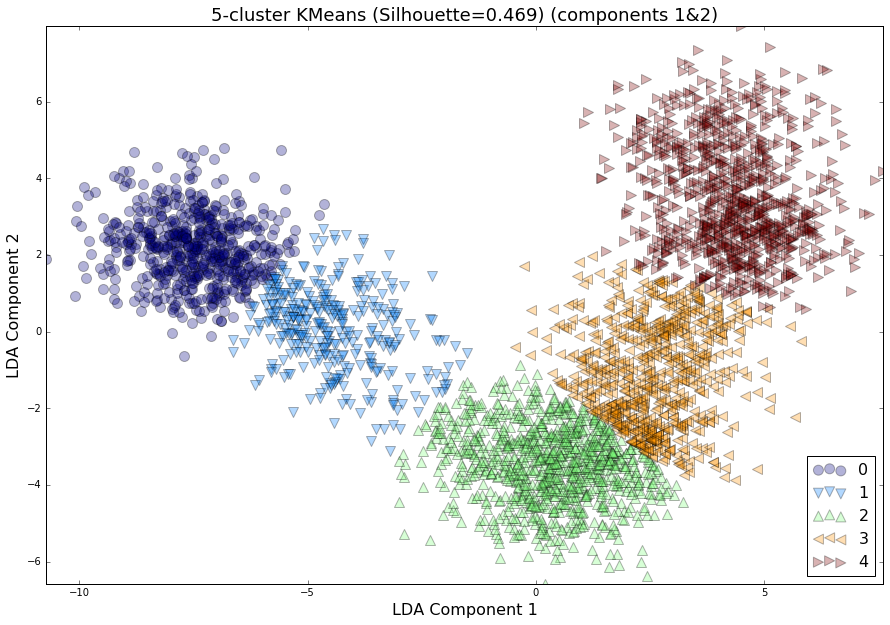

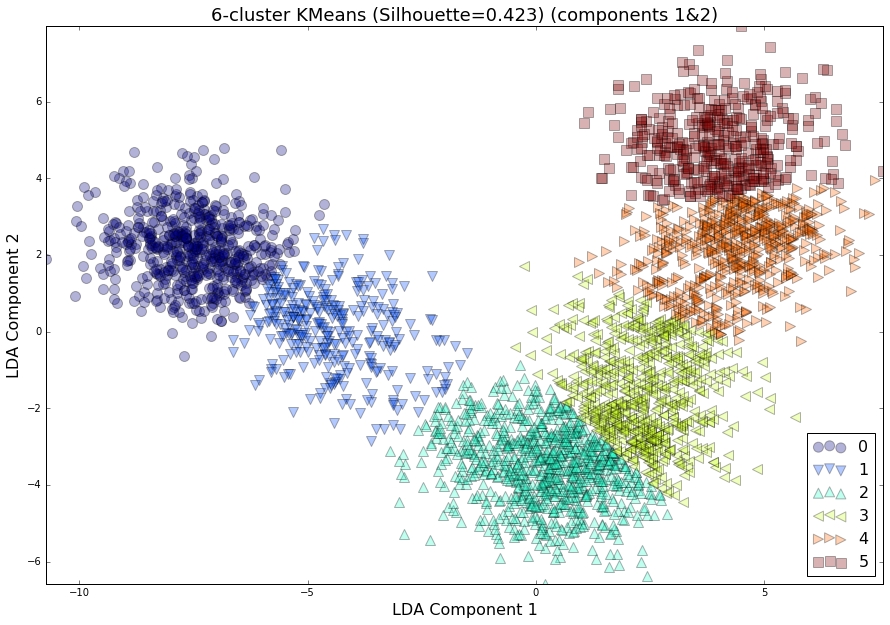

...

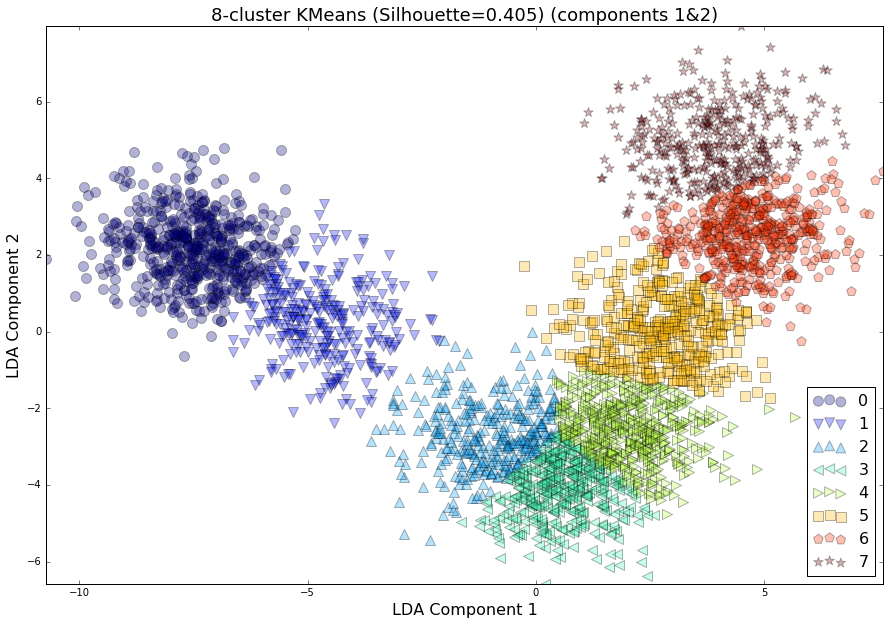

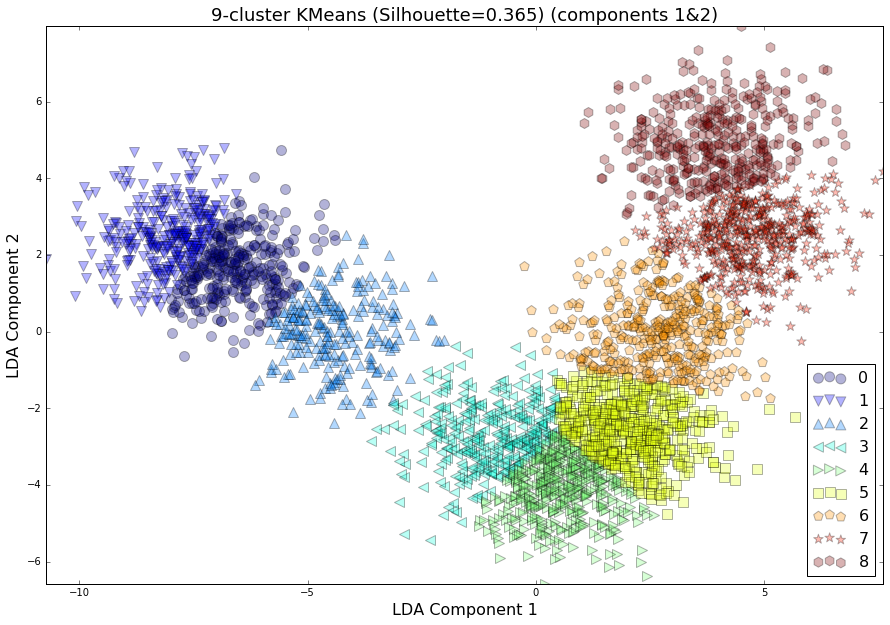

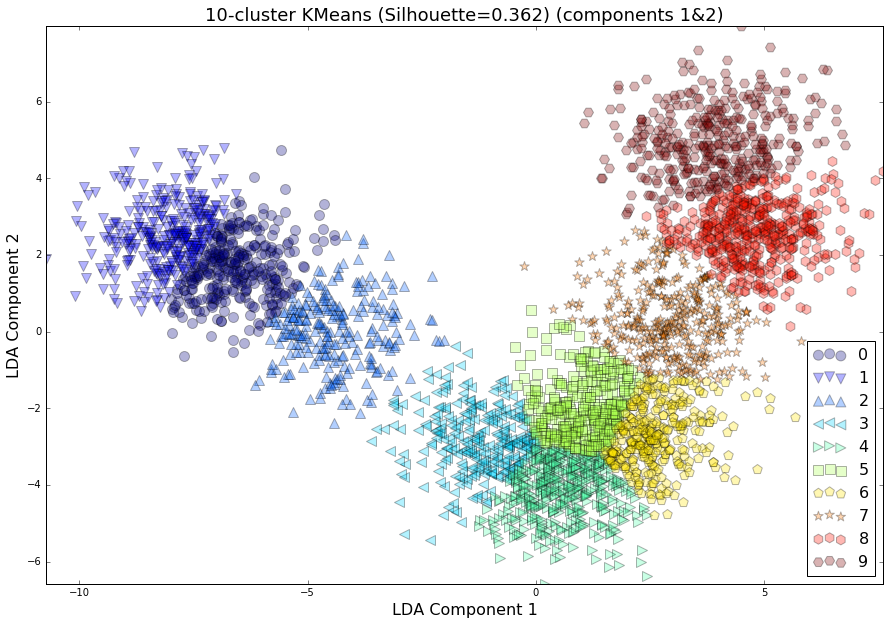

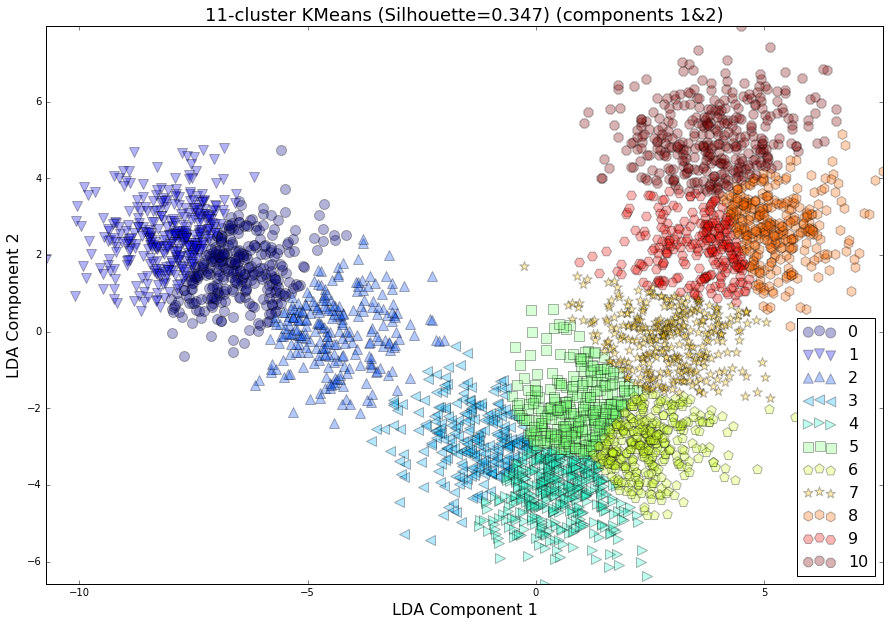

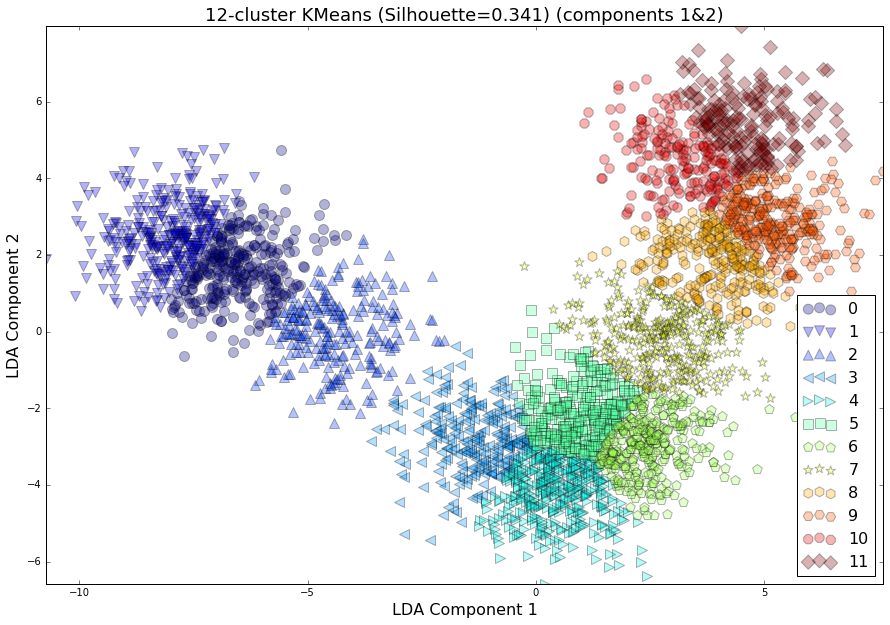

In [68]:
for n in xrange(2, 13):
    print '====================='
    print n, "KMEANS CLUSTERS in the first 2 dimensions"
    try_kmeans_Proj_1_2( n)